# 03 — CLIP Fine-Tuning VariantsThree approaches to adapting CLIP ViT-B/32 to Flickr30k, all sharing the same data pipeline and `HardNegativeInfoNCELoss`:1. **Projection head** — frozen backbone + small 256-d MLP heads.2. **Full fine-tune** — every CLIP parameter trainable.3. **LoRA r=8** — adapters on `q_proj`/`v_proj` only, < 1 % of params.A final section ablates the hard-negative weight.

## 1. Setup

In [ ]:
import sys
from pathlib import Path

PROJECT_ROOT = Path.cwd().parent
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

from src.config import get_device, set_seeds

set_seeds(42)
device = get_device()
print(f"Device: {device}")

In [ ]:
import gc
import os
import time
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from peft import LoraConfig, PeftModel, TaskType, get_peft_model
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as TorchDataset

from src.clip_embeddings import (
    encode_images,
    encode_texts,
    extract_and_cache_images,
    extract_and_cache_texts,
    load_clip_model,
    load_embeddings,
    save_embeddings,
)
from src.config import EMBEDDINGS_DIR, MODELS_DIR, RESULTS_DIR
from src.data import get_all_captions_flat, get_captions, get_image, load_karpathy_splits
from src.evaluation import (
    evaluate_image_to_text,
    evaluate_text_to_image,
    load_results,
    print_results_table,
    recall_at_k,
    save_results,
)
from src.retrieval import get_ranks, get_similarity_scores, text_to_image_search
from src.training import (
    CLIPRetrievalDataset,
    HardNegativeInfoNCELoss,
    ProjectionHead,
    finish_wandb,
    get_optimizer,
    get_scheduler,
    init_wandb,
    load_checkpoint,
    log_artifact,
    log_summary,
    log_train_step,
    log_val_metrics,
    make_collate_fn,
    mine_hard_negatives_offline,
    run_validation,
    run_validation_projection,
    save_checkpoint,
    training_step,
)
from src.visualize import (
    plot_rank_distribution,
    plot_recall_comparison,
    plot_retrieval_results,
    plot_training_curves,
)

splits = load_karpathy_splits()
train_captions, train_gt = get_all_captions_flat(splits["train"])
val_captions, val_gt = get_all_captions_flat(splits["val"])
test_captions, test_gt = get_all_captions_flat(splits["test"])
test_ds = splits["test"]
print({k: len(v) for k, v in splits.items()})

## 2. Projection head on frozen CLIP

## 3. Pre-compute frozen CLIP embeddings

Encode all train/val/test images and captions with frozen CLIP ViT-B/32 once, cache to disk, then drop the CLIP model from memory. The training loop reads from `data/embeddings/` and never touches CLIP again.


In [3]:
MODEL_KEY = "clip-vit-b-32"

# Image embeddings (one per unique image in each split)
train_img_emb = extract_and_cache_images(splits["train"], MODEL_KEY, split="train")
val_img_emb = extract_and_cache_images(splits["val"], MODEL_KEY, split="val")
test_img_emb = extract_and_cache_images(splits["test"], MODEL_KEY, split="test")

# Text embeddings (one per caption)
train_txt_emb = extract_and_cache_texts(train_captions, MODEL_KEY, split="train")
val_txt_emb = extract_and_cache_texts(val_captions, MODEL_KEY, split="val")
test_txt_emb = extract_and_cache_texts(test_captions, MODEL_KEY, split="test")

print(f"Train images: {train_img_emb.shape}, Train texts: {train_txt_emb.shape}")
print(f"Val   images: {val_img_emb.shape},   Val texts:   {val_txt_emb.shape}")
print(f"Test  images: {test_img_emb.shape},  Test texts:  {test_txt_emb.shape}")

Loading cached clip-vit-b-32_images_train from /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-32_images_train.npy
Loading cached clip-vit-b-32_images_val from /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-32_images_val.npy
Loading cached clip-vit-b-32_images_test from /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-32_images_test.npy
Loading cached clip-vit-b-32_texts_train from /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-32_texts_train.npy
Loading cached clip-vit-b-32_texts_val from /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-32_texts_val.npy
Loading cached clip-vit-b-32_texts_test from /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-32_texts_test.npy
Train images: (29000, 512), Train texts: (145000, 512)
Val   images: (1014, 512),   Val texts:   (5070, 512)
Test  images: (1000, 512),  Test 

In [4]:
# Free any CLIP model that may have been loaded during extraction
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

In [5]:
image_proj = ProjectionHead(input_dim=512, hidden_dim=512, output_dim=256).to(device)
text_proj = ProjectionHead(input_dim=512, hidden_dim=512, output_dim=256).to(device)

img_params = sum(p.numel() for p in image_proj.parameters() if p.requires_grad)
txt_params = sum(p.numel() for p in text_proj.parameters() if p.requires_grad)
print(f"Image projection: {img_params:,} trainable params")
print(f"Text  projection: {txt_params:,} trainable params")
print(f"Total trainable:  {img_params + txt_params:,} params")

Image projection: 393,984 trainable params
Text  projection: 393,984 trainable params
Total trainable:  787,968 params


In [6]:
class EmbeddingPairDataset(TorchDataset):
    """Dataset of pre-computed (text_embedding, image_embedding) pairs.

    For each caption, pairs its text embedding with the corresponding
    ground-truth image embedding.
    """

    def __init__(self, image_embs: np.ndarray, text_embs: np.ndarray, gt_indices: np.ndarray):
        self.text_embs = torch.from_numpy(text_embs).float()
        self.image_embs = torch.from_numpy(image_embs[gt_indices]).float()

    def __len__(self) -> int:
        return len(self.text_embs)

    def __getitem__(self, idx: int) -> tuple[torch.Tensor, torch.Tensor]:
        return self.text_embs[idx], self.image_embs[idx]


# Hyperparameters
NUM_EPOCHS = 10
BATCH_SIZE = 256
LR = 1e-4
WEIGHT_DECAY = 0.01

# Dataset & DataLoader
train_dataset = EmbeddingPairDataset(train_img_emb, train_txt_emb, train_gt)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

print(f"Training samples: {len(train_dataset)}")
print(f"Batches per epoch: {len(train_loader)}")

# Loss, optimizer
loss_fn = HardNegativeInfoNCELoss(temperature=0.07)
params = list(image_proj.parameters()) + list(text_proj.parameters())
optimizer = torch.optim.AdamW(params, lr=LR, weight_decay=WEIGHT_DECAY)

Training samples: 145000
Batches per epoch: 566


In [ ]:
RUN_TRAINING = True  # Set to False to skip training

if RUN_TRAINING:
    CHECKPOINT_DIR = MODELS_DIR / "projection_head"
    CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)

    run = init_wandb(
        run_name="projection_head_b32",
        config={
            "approach": "projection_head",
            "model": "clip-vit-b-32",
            "batch_size": BATCH_SIZE,
            "lr": LR,
            "num_epochs": NUM_EPOCHS,
            "weight_decay": WEIGHT_DECAY,
            "temperature": 0.07,
            "hard_negative_weight": 2.0,
            "loss": "HardNegativeInfoNCE",
            "projection_input_dim": 512,
            "projection_hidden_dim": 512,
            "projection_output_dim": 256,
            "seed": 42,
            "device": str(device),
        },
        tags=["projection_head"],
    )

    best_val_r1 = 0.0
    train_losses: list[float] = []
    val_metrics_history: dict[str, list[float]] = {"R@1": [], "R@5": [], "R@10": []}
    global_step = 0

    for epoch in range(NUM_EPOCHS):
        # -- Train --
        image_proj.train()
        text_proj.train()
        epoch_losses: list[float] = []
        ep_start = time.time()

        for text_emb_batch, img_emb_batch in train_loader:
            text_emb_batch = text_emb_batch.to(device, non_blocking=True)
            img_emb_batch = img_emb_batch.to(device, non_blocking=True)

            proj_text = text_proj(text_emb_batch)   # (B, 256)
            proj_img = image_proj(img_emb_batch)    # (B, 256)

            loss = loss_fn(proj_img, proj_text)
            if not torch.isfinite(loss):
                raise RuntimeError(f"Non-finite loss at step {global_step}: {loss.item()}")

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_losses.append(loss.item())
            train_losses.append(loss.item())
            log_train_step(
                {"loss": loss.item(), "lr": optimizer.param_groups[0]["lr"]},
                step=global_step,
            )
            global_step += 1

        avg_loss = float(np.mean(epoch_losses))

        # -- Validate --
        val_results = run_validation_projection(
            image_proj, text_proj, val_img_emb, val_txt_emb, val_gt, device=device
        )

        for k in ["R@1", "R@5", "R@10"]:
            val_metrics_history[k].append(val_results[k])

        log_val_metrics(
            {
                "R@1": val_results["R@1"],
                "R@5": val_results["R@5"],
                "R@10": val_results["R@10"],
                "MedianR": val_results["MedianR"],
                "MeanR": val_results["MeanR"],
                "epoch_loss": avg_loss,
            },
            epoch=epoch,
        )

        print(
            f"Epoch {epoch+1} done in {time.time() - ep_start:.0f}s: loss={avg_loss:.4f} | "
            f"Val R@1={val_results['R@1']:.3f} R@5={val_results['R@5']:.3f} R@10={val_results['R@10']:.3f}",
            flush=True,
        )

        if val_results["R@1"] > best_val_r1:
            best_val_r1 = val_results["R@1"]
            torch.save(
                {
                    "image_proj_state_dict": image_proj.state_dict(),
                    "text_proj_state_dict": text_proj.state_dict(),
                    "epoch": epoch,
                    "val_results": val_results,
                },
                CHECKPOINT_DIR / "best_projection.pt",
            )
            print(f"  -> New best! Saved checkpoint (R@1={best_val_r1:.3f})")

    print(f"\nBest validation R@1: {best_val_r1:.3f}")


In [ ]:
TRAINING_COMPLETE = True  # Set to False to skip evaluation

if TRAINING_COMPLETE:
    CHECKPOINT_DIR = MODELS_DIR / "projection_head"

    checkpoint = torch.load(
        CHECKPOINT_DIR / "best_projection.pt", map_location=device, weights_only=False
    )
    image_proj.load_state_dict(checkpoint["image_proj_state_dict"])
    text_proj.load_state_dict(checkpoint["text_proj_state_dict"])
    print(f"Loaded checkpoint from epoch {checkpoint['epoch']+1}")

    image_proj.eval()
    text_proj.eval()
    with torch.no_grad():
        test_img_proj = image_proj(torch.from_numpy(test_img_emb).float().to(device)).cpu().numpy()
        test_txt_proj = text_proj(torch.from_numpy(test_txt_emb).float().to(device)).cpu().numpy()

    # Cache projected test embeddings under the app's discovery pattern
    np.save(EMBEDDINGS_DIR / "projection_b32_images_test.npy", test_img_proj)
    np.save(EMBEDDINGS_DIR / "projection_b32_texts_test.npy", test_txt_proj)
    print(
        f"Cached projected test embeddings: "
        f"{test_img_proj.shape} images, {test_txt_proj.shape} texts"
    )

    proj_results = evaluate_text_to_image(test_txt_proj, test_img_proj, test_gt)
    save_results(proj_results, "projection_head_b32")
    print("\nProjection Head Results:")
    for k, v in proj_results.items():
        print(f"  {k}: {v:.1%}" if k.startswith("R@") else f"  {k}: {v:.4f}")

    # Log final test metrics + checkpoint artifact to wandb (if a run is active)
    log_summary(proj_results, prefix="test")
    log_artifact(
        CHECKPOINT_DIR / "best_projection.pt",
        name="projection_head_b32",
        artifact_type="model",
    )
    finish_wandb()


In [ ]:
TRAINING_COMPLETE = True  # Set to False to skip comparison

if TRAINING_COMPLETE:
    try:
        baseline_results = load_results("baseline_b32")
    except FileNotFoundError:
        try:
            baseline_results = load_results("baseline_clip-vit-b-32")
        except FileNotFoundError:
            baseline_results = evaluate_text_to_image(test_txt_emb, test_img_emb, test_gt)
            save_results(baseline_results, "baseline_clip-vit-b-32")

    comparison = {
        "CLIP B/32 (baseline)": baseline_results,
        "CLIP B/32 + Projection": proj_results,
    }
    print_results_table(comparison)
    plot_recall_comparison(comparison, title="Baseline vs Projection Head")


In [ ]:
TRAINING_COMPLETE = True  # Set to False to skip plot

if TRAINING_COMPLETE:
    plot_training_curves(train_losses, val_metrics_history, title="Projection Head Training")


In [ ]:
TRAINING_COMPLETE = True  # Set to False to skip qualitative examples

if TRAINING_COMPLETE:
    from src.retrieval import text_to_image_search

    n_examples = 5
    rng = np.random.default_rng(42)
    sample_indices = rng.choice(len(test_captions), size=n_examples, replace=False)

    for idx in sample_indices:
        query = test_captions[idx]
        gt_img_idx = int(test_gt[idx])

        results = text_to_image_search(test_txt_proj[idx], test_img_proj, top_k=5)
        fig = plot_retrieval_results(
            query, results, splits["test"], ground_truth_idx=gt_img_idx
        )
        fig.show()


## 3. Full fine-tune

In [3]:
model, processor = load_clip_model("clip-vit-b-32", device=device)

# Unfreeze all parameters
for param in model.parameters():
    param.requires_grad = True
model.train()

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters:     {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Trainable ratio:      {trainable_params / total_params:.1%}")

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Total parameters:     151,277,313
Trainable parameters: 151,277,313
Trainable ratio:      100.0%


In [4]:
# Full CLIP fine-tune: 88M params, larger activation footprint than scratch.
# bf16 AMP lets BS=128 fit comfortably on a 5090.
BATCH_SIZE = int(os.environ.get("BATCH_SIZE", "128" if device.type == "cuda" else "32"))
EVAL_BATCH_SIZE = int(os.environ.get("EVAL_BATCH_SIZE", "256" if device.type == "cuda" else "64"))
NUM_WORKERS = int(os.environ.get("NUM_WORKERS", "12" if device.type == "cuda" else "0"))
PREFETCH_FACTOR = int(os.environ.get("PREFETCH_FACTOR", "4")) if NUM_WORKERS > 0 else None

train_dataset = CLIPRetrievalDataset(splits["train"], processor)
loader_kwargs = dict(
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=make_collate_fn(processor),
    num_workers=NUM_WORKERS,
    pin_memory=(device.type == "cuda"),
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=True,
)
if NUM_WORKERS > 0 and PREFETCH_FACTOR is not None:
    loader_kwargs["prefetch_factor"] = PREFETCH_FACTOR
train_loader = DataLoader(train_dataset, **loader_kwargs)

print(f"Training images: {len(train_dataset)}")
print(f"Batches per epoch: {len(train_loader)}")
print(f"Batch size: {BATCH_SIZE}, num_workers: {NUM_WORKERS}")

sample_batch = next(iter(train_loader))
print("\nSample batch:")
print(f"  pixel_values:  {sample_batch['pixel_values'].shape}")
print(f"  input_ids:     {sample_batch['input_ids'].shape}")
print(f"  attention_mask: {sample_batch['attention_mask'].shape}")


Training images: 29000
Batches per epoch: 226
Batch size: 128, num_workers: 12



Sample batch:
  pixel_values:  torch.Size([128, 3, 224, 224])
  input_ids:     torch.Size([128, 32])
  attention_mask: torch.Size([128, 32])


In [5]:
NUM_EPOCHS = int(os.environ.get("EPOCH_OVERRIDE", "3"))
LR = 2e-6
WEIGHT_DECAY = 0.01
GRADIENT_ACCUMULATION_STEPS = 1  # effective batch size = BATCH_SIZE
MAX_GRAD_NORM = 1.0
WARMUP_RATIO = 0.1
LOG_EVERY = 50

# bf16 AMP (no GradScaler needed). Blackwell has native bf16 tensor cores.
AMP_DTYPE = torch.bfloat16 if device.type == "cuda" else torch.float32
USE_AMP = device.type == "cuda"

loss_fn = HardNegativeInfoNCELoss(temperature=0.07)
optimizer = get_optimizer(model, lr=LR, weight_decay=WEIGHT_DECAY)

num_training_steps = (len(train_loader) // GRADIENT_ACCUMULATION_STEPS) * NUM_EPOCHS
scheduler = get_scheduler(optimizer, num_training_steps, warmup_ratio=WARMUP_RATIO)

print(f"NUM_EPOCHS={NUM_EPOCHS} BATCH_SIZE={BATCH_SIZE} effective={BATCH_SIZE * GRADIENT_ACCUMULATION_STEPS}")
print(f"Total optimization steps: {num_training_steps}")
print(f"Warmup steps: {int(num_training_steps * WARMUP_RATIO)}")
print(f"AMP={USE_AMP} ({AMP_DTYPE})")


NUM_EPOCHS=3 BATCH_SIZE=128 effective=128
Total optimization steps: 678
Warmup steps: 67
AMP=True (torch.bfloat16)


In [6]:
RUN_TRAINING = True  # Set to False to skip training

if RUN_TRAINING:
    CHECKPOINT_DIR = MODELS_DIR / "full_finetune"
    CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)

    run = init_wandb(
        run_name="full_ft_b32",
        config={
            "approach": "full_finetune",
            "model": "clip-vit-b-32",
            "batch_size": BATCH_SIZE,
            "effective_batch_size": BATCH_SIZE * GRADIENT_ACCUMULATION_STEPS,
            "lr": LR,
            "num_epochs": NUM_EPOCHS,
            "weight_decay": WEIGHT_DECAY,
            "warmup_ratio": WARMUP_RATIO,
            "max_grad_norm": MAX_GRAD_NORM,
            "gradient_accumulation_steps": GRADIENT_ACCUMULATION_STEPS,
            "temperature": 0.07,
            "hard_negative_weight": 2.0,
            "loss": "HardNegativeInfoNCE",
            "trainable_params": int(sum(p.numel() for p in model.parameters() if p.requires_grad)),
            "seed": 42,
            "device": str(device),
        },
        tags=["full_ft"],
    )
    try:
        import wandb
        wandb.watch(model, log="gradients", log_freq=200)
    except Exception:
        pass

    best_val_r1 = 0.0
    train_losses: list[float] = []
    val_metrics_history: dict[str, list[float]] = {"R@1": [], "R@5": [], "R@10": []}
    step_metrics: list[dict] = []
    global_step = 0

    for epoch in range(NUM_EPOCHS):
        model.train()
        epoch_losses: list[float] = []
        ep_start = time.time()
        optimizer.zero_grad()

        for batch_idx, batch in enumerate(train_loader):
            with torch.amp.autocast(
                device_type=device.type, enabled=USE_AMP, dtype=AMP_DTYPE
            ):
                loss, metrics = training_step(model, batch, loss_fn, device)

            scaled_loss = loss / GRADIENT_ACCUMULATION_STEPS
            scaled_loss.backward()

            epoch_losses.append(loss.item())
            train_losses.append(loss.item())

            if (batch_idx + 1) % GRADIENT_ACCUMULATION_STEPS == 0:
                torch.nn.utils.clip_grad_norm_(model.parameters(), MAX_GRAD_NORM)
                optimizer.step()
                scheduler.step()
                optimizer.zero_grad()
                global_step += 1
                log_train_step(
                    {
                        "loss": metrics["loss"],
                        "acc_i2t": metrics["acc_i2t"],
                        "acc_t2i": metrics["acc_t2i"],
                        "lr": scheduler.get_last_lr()[0],
                    },
                    step=global_step,
                )

            if (batch_idx + 1) % LOG_EVERY == 0:
                lr_current = scheduler.get_last_lr()[0]
                step_metrics.append({"step": global_step, **metrics, "lr": lr_current})

        # Flush remaining gradients at epoch end
        if (batch_idx + 1) % GRADIENT_ACCUMULATION_STEPS != 0:
            torch.nn.utils.clip_grad_norm_(model.parameters(), MAX_GRAD_NORM)
            optimizer.step()
            scheduler.step()
            optimizer.zero_grad()
            global_step += 1

        avg_loss = float(np.mean(epoch_losses))

        # -- Validation --
        val_results = run_validation(
            model, processor, splits["val"], val_captions, val_gt, device=device
        )

        for k in ["R@1", "R@5", "R@10"]:
            val_metrics_history[k].append(val_results[k])

        log_val_metrics(
            {
                "R@1": val_results["R@1"],
                "R@5": val_results["R@5"],
                "R@10": val_results["R@10"],
                "MedianR": val_results["MedianR"],
                "MeanR": val_results["MeanR"],
                "epoch_loss": avg_loss,
            },
            epoch=epoch,
        )

        print(
            f"Epoch {epoch+1} done in {time.time() - ep_start:.0f}s: loss={avg_loss:.4f} | "
            f"Val R@1={val_results['R@1']:.3f} R@5={val_results['R@5']:.3f} R@10={val_results['R@10']:.3f}",
            flush=True,
        )

        if val_results["R@1"] > best_val_r1:
            best_val_r1 = val_results["R@1"]
            save_checkpoint(
                model, optimizer, epoch, avg_loss,
                CHECKPOINT_DIR / "best_full_finetune.pt",
            )
            print(f"  -> New best! Saved checkpoint (R@1={best_val_r1:.3f})")

    print(f"\nBest validation R@1: {best_val_r1:.3f}")


wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /home/students/xvysnya/.netrc.


wandb: Currently logged in as: vysnyandrej (vysnyandrej-slovak-university-of-technology-in-bratislava) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


wandb: setting up run 1kn8e8qk


wandb: Tracking run with wandb version 0.26.1


wandb: Run data is saved locally in /home/students/xvysnya/Project2/notebooks/wandb/run-20260504_230545-1kn8e8qk
wandb: Run `wandb offline` to turn off syncing.


wandb: Syncing run full_ft_b32


wandb: ⭐️ View project at https://wandb.ai/vysnyandrej-slovak-university-of-technology-in-bratislava/nsiete-flickr30k-clip


wandb: 🚀 View run at https://wandb.ai/vysnyandrej-slovak-university-of-technology-in-bratislava/nsiete-flickr30k-clip/runs/1kn8e8qk


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:04,  3.33it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:02,  4.79it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:02,  5.46it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:02,  5.85it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  6.21it/s]

Encoding images:  38%|███▊      | 6/16 [00:01<00:01,  6.47it/s]

Encoding images:  44%|████▍     | 7/16 [00:01<00:01,  6.58it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  6.63it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:01,  6.69it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  6.67it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  6.64it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  6.60it/s]

Encoding images:  81%|████████▏ | 13/16 [00:02<00:00,  6.57it/s]

Encoding images:  88%|████████▊ | 14/16 [00:02<00:00,  6.68it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  6.72it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  6.55it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  6.30it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  18%|█▊        | 14/80 [00:00<00:00, 137.58it/s]

Encoding texts:  38%|███▊      | 30/80 [00:00<00:00, 145.58it/s]

Encoding texts:  56%|█████▋    | 45/80 [00:00<00:00, 146.38it/s]

Encoding texts:  75%|███████▌  | 60/80 [00:00<00:00, 144.20it/s]

Encoding texts:  94%|█████████▍| 75/80 [00:00<00:00, 143.46it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 144.14it/s]

Epoch 1 done in 20s: loss=1.4904 | Val R@1=0.698 R@5=0.900 R@10=0.941


wandb: WARNING Tried to log to step 0 that is less than the current step 226. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Checkpoint saved to /home/students/xvysnya/Project2/data/models/full_finetune/best_full_finetune.pt
  -> New best! Saved checkpoint (R@1=0.698)


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:02,  7.27it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:01,  7.22it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  7.22it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  7.18it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  7.15it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  7.15it/s]

Encoding images:  44%|████▍     | 7/16 [00:00<00:01,  7.00it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  7.00it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:00,  7.02it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  7.09it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  7.07it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  7.09it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  7.09it/s]

Encoding images:  88%|████████▊ | 14/16 [00:01<00:00,  7.08it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  7.07it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.24it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.12it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  19%|█▉        | 15/80 [00:00<00:00, 143.13it/s]

Encoding texts:  38%|███▊      | 30/80 [00:00<00:00, 146.27it/s]

Encoding texts:  56%|█████▋    | 45/80 [00:00<00:00, 146.37it/s]

Encoding texts:  75%|███████▌  | 60/80 [00:00<00:00, 143.49it/s]

Encoding texts:  94%|█████████▍| 75/80 [00:00<00:00, 143.90it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 144.85it/s]

Epoch 2 done in 19s: loss=0.9310 | Val R@1=0.705 R@5=0.901 R@10=0.943


wandb: WARNING Tried to log to step 1 that is less than the current step 452. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Checkpoint saved to /home/students/xvysnya/Project2/data/models/full_finetune/best_full_finetune.pt
  -> New best! Saved checkpoint (R@1=0.705)


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:02,  6.96it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:01,  7.13it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  7.21it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  7.24it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  7.27it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  7.27it/s]

Encoding images:  44%|████▍     | 7/16 [00:00<00:01,  7.19it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  7.21it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:00,  7.26it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  7.16it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  7.14it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  7.11it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  7.03it/s]

Encoding images:  88%|████████▊ | 14/16 [00:01<00:00,  7.13it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  7.07it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.35it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.20it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  19%|█▉        | 15/80 [00:00<00:00, 143.39it/s]

Encoding texts:  39%|███▉      | 31/80 [00:00<00:00, 149.36it/s]

Encoding texts:  57%|█████▊    | 46/80 [00:00<00:00, 147.56it/s]

Encoding texts:  76%|███████▋  | 61/80 [00:00<00:00, 142.75it/s]

Encoding texts:  95%|█████████▌| 76/80 [00:00<00:00, 143.59it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 144.89it/s]

Epoch 3 done in 19s: loss=0.8628 | Val R@1=0.699 R@5=0.899 R@10=0.943



Best validation R@1: 0.705


In [7]:
TRAINING_COMPLETE = True  # Set to False to skip evaluation

if TRAINING_COMPLETE:
    CHECKPOINT_DIR = MODELS_DIR / "full_finetune"
    checkpoint = load_checkpoint(
        CHECKPOINT_DIR / "best_full_finetune.pt", model, optimizer, device=device
    )
    print(f"Loaded checkpoint from epoch {checkpoint['epoch']+1}")

    model.eval()
    with torch.no_grad():
        test_img_emb = encode_images(splits["test"], model, processor, device=device)
        test_txt_emb = encode_texts(test_captions, model, processor, device=device)

    np.save(EMBEDDINGS_DIR / "full_b32_images_test.npy", test_img_emb)
    np.save(EMBEDDINGS_DIR / "full_b32_texts_test.npy", test_txt_emb)
    print(
        f"Cached fully-fine-tuned test embeddings: "
        f"{test_img_emb.shape} images, {test_txt_emb.shape} texts"
    )

    full_ft_results = evaluate_text_to_image(test_txt_emb, test_img_emb, test_gt)
    save_results(full_ft_results, "full_finetune_b32")
    print("\nFull Fine-tune Results:")
    for k, v in full_ft_results.items():
        print(f"  {k}: {v:.1%}" if k.startswith("R@") else f"  {k}: {v:.4f}")

    log_summary(full_ft_results, prefix="test")
    # Skip artifact upload: full FT checkpoint is ~600 MB


wandb: WARNING Tried to log to step 2 that is less than the current step 678. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Loaded checkpoint from epoch 2


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:02,  7.38it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:01,  7.31it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  7.19it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  7.02it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  7.05it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  6.96it/s]

Encoding images:  44%|████▍     | 7/16 [00:00<00:01,  7.01it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  6.98it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:01,  6.99it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  7.01it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  7.03it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  6.93it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  6.96it/s]

Encoding images:  88%|████████▊ | 14/16 [00:02<00:00,  6.90it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  6.95it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  6.79it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  6.96it/s]

Encoding texts:   0%|          | 0/79 [00:00<?, ?it/s]

Encoding texts:  18%|█▊        | 14/79 [00:00<00:00, 137.91it/s]

Encoding texts:  37%|███▋      | 29/79 [00:00<00:00, 142.79it/s]

Encoding texts:  57%|█████▋    | 45/79 [00:00<00:00, 148.80it/s]

Encoding texts:  76%|███████▌  | 60/79 [00:00<00:00, 147.73it/s]

Encoding texts:  95%|█████████▍| 75/79 [00:00<00:00, 139.81it/s]

Encoding texts: 100%|██████████| 79/79 [00:00<00:00, 142.20it/s]

Cached fully-fine-tuned test embeddings: (1000, 512) images, (5000, 512) texts
Saved results to /home/students/xvysnya/Project2/data/results/full_finetune_b32.json

Full Fine-tune Results:
  R@1: 68.5%
  R@5: 90.1%
  R@10: 94.3%
  MedianR: 1.0000
  MeanR: 3.8452



  Text-to-Image Retrieval Results
Model                           R@1       R@5      R@10   MedianR     MeanR
---------------------------------------------------------------------------
CLIP B/32 (baseline)         58.6%    83.5%    89.9%       1.0       6.1
CLIP B/32 + Projection       63.7%    88.2%    93.5%       1.0       4.7
CLIP B/32 Full FT            68.5%    90.1%    94.3%       1.0       3.8



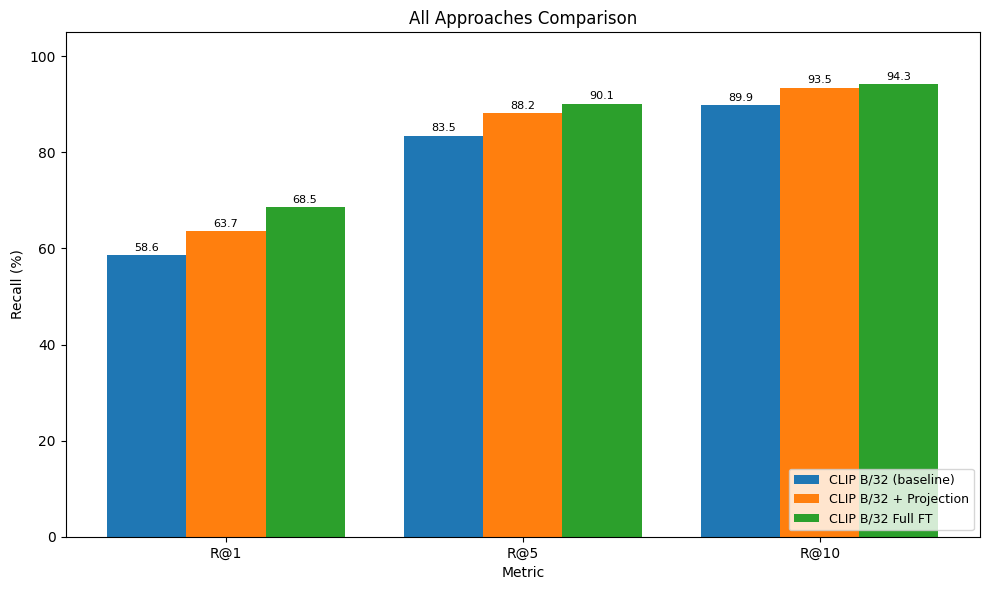

In [8]:
TRAINING_COMPLETE = True  # Set to False to skip comparison

if TRAINING_COMPLETE:
    comparison: dict = {}

    for display, candidates in [
        ("CLIP B/32 (baseline)", ["baseline_b32", "baseline_clip-vit-b-32"]),
        ("CLIP B/32 + Projection", ["projection_head_b32"]),
        ("CLIP B/32 Full FT", ["full_finetune_b32"]),
    ]:
        for fname in candidates:
            try:
                comparison[display] = load_results(fname)
                break
            except FileNotFoundError:
                continue

    if comparison:
        print_results_table(comparison)
        plot_recall_comparison(comparison, title="All Approaches Comparison")


Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:02,  6.76it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:02,  6.27it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:02,  6.38it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  6.41it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  6.63it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  6.74it/s]

Encoding images:  44%|████▍     | 7/16 [00:01<00:01,  6.88it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  6.83it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:01,  6.87it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  6.91it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  6.91it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  6.90it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  6.92it/s]

Encoding images:  88%|████████▊ | 14/16 [00:02<00:00,  6.84it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  6.88it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  6.93it/s]

Encoding texts:   0%|          | 0/1 [00:00<?, ?it/s]

Encoding texts: 100%|██████████| 1/1 [00:00<00:00, 148.42it/s]

Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:02,  7.02it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:01,  7.28it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  7.25it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  7.02it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  7.04it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  6.97it/s]

Encoding images:  44%|████▍     | 7/16 [00:00<00:01,  7.01it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  6.93it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:01,  6.92it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  6.99it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  7.04it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  6.94it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  6.98it/s]

Encoding images:  88%|████████▊ | 14/16 [00:02<00:00,  6.96it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  6.99it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.18it/s]

Encoding texts:   0%|          | 0/1 [00:00<?, ?it/s]

Encoding texts: 100%|██████████| 1/1 [00:00<00:00, 158.62it/s]


Catastrophic forgetting summary (30+ generic queries):
  n_queries: 30
  mean_rank_shift: 6.433333333333334
  median_rank_shift: 1.0
  max_rank_shift: 49
  frac_unchanged_top1: 0.4
Saved results to /home/students/xvysnya/Project2/data/results/catastrophic_forgetting_summary.json


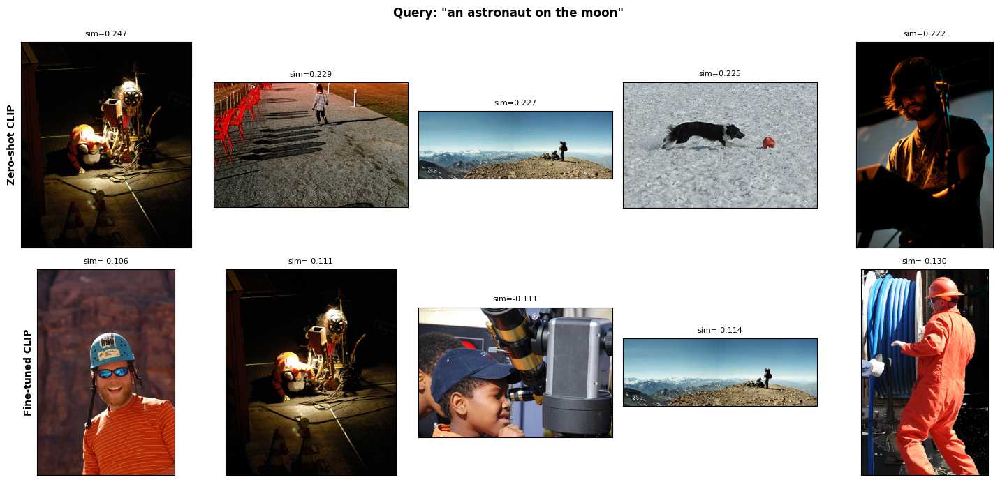

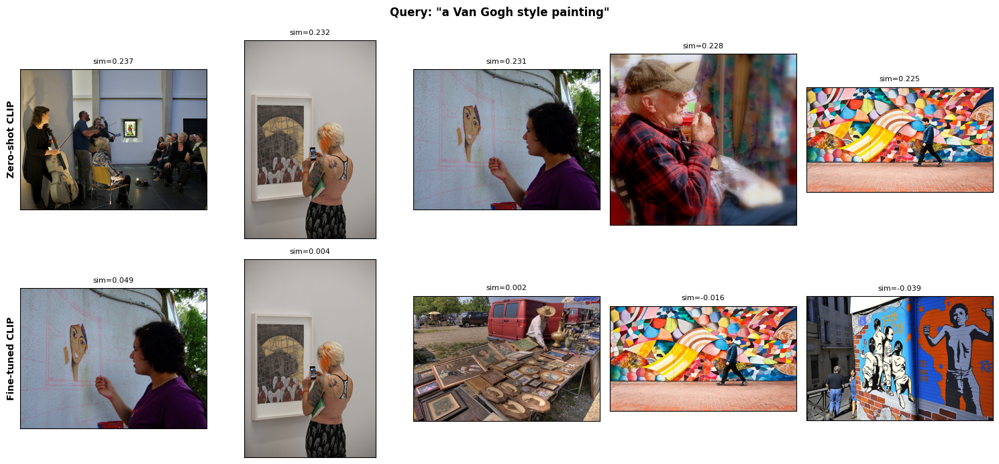

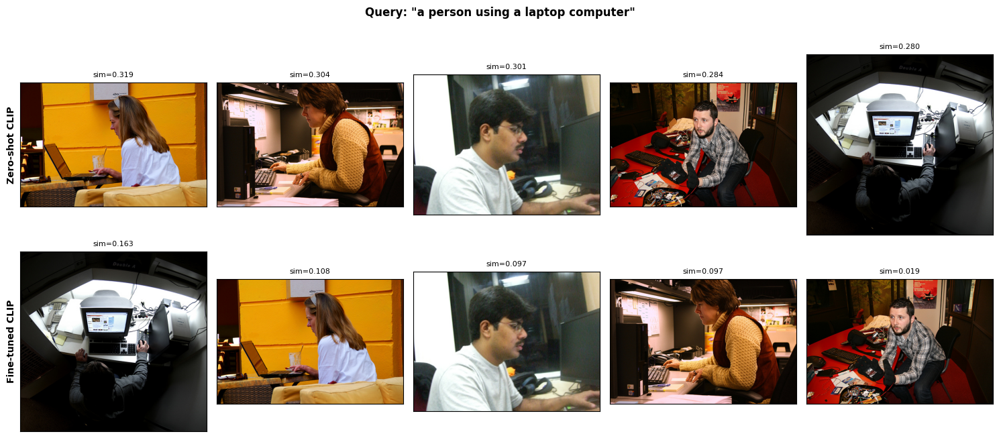

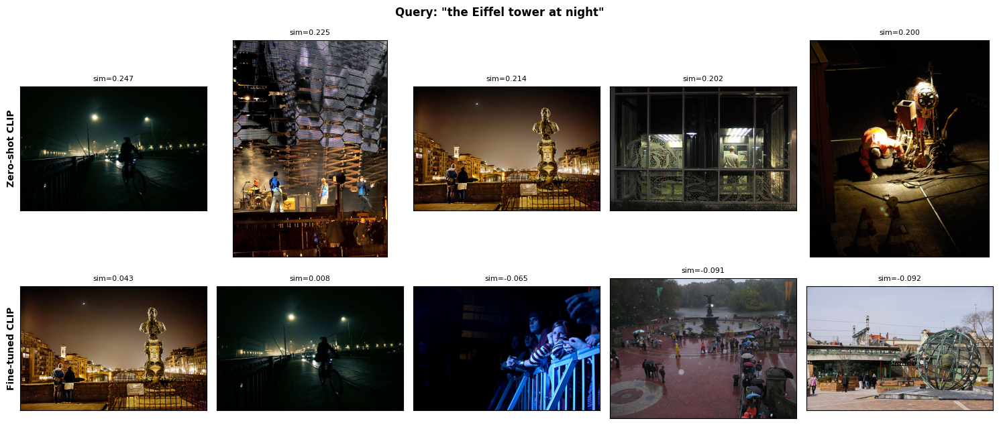

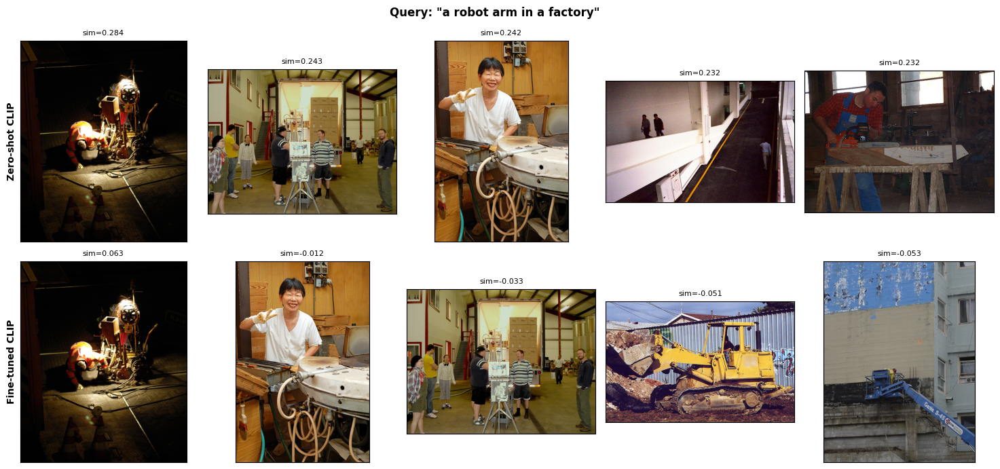

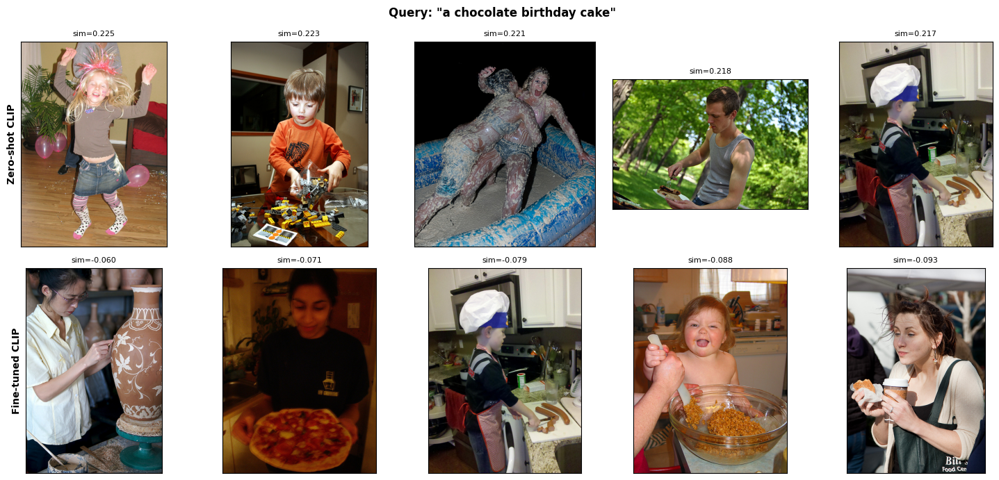

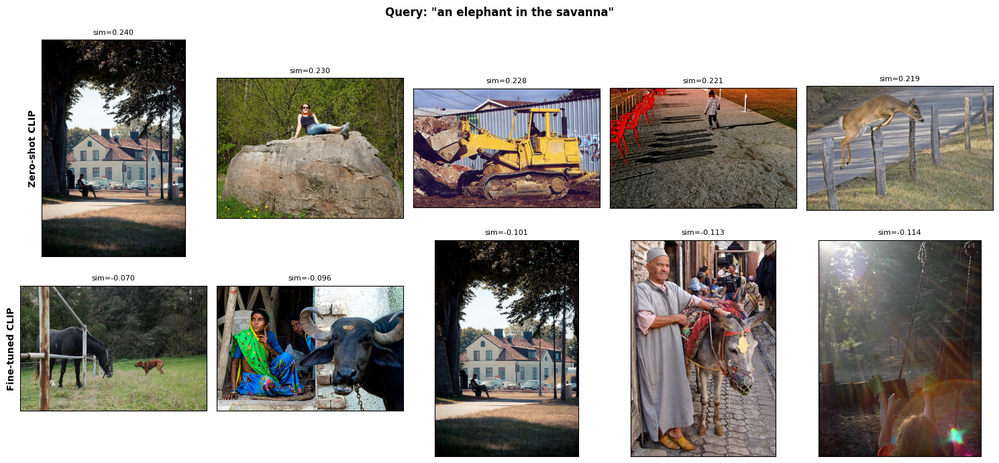

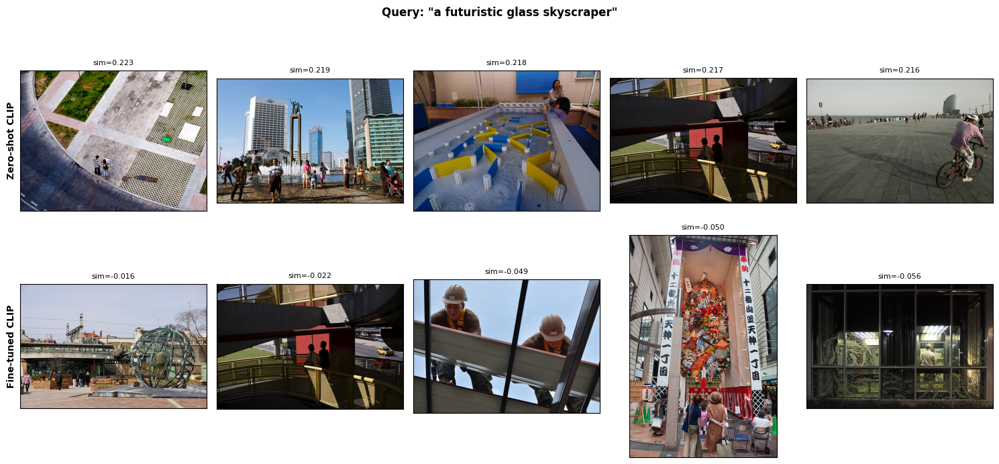

In [9]:
TRAINING_COMPLETE = True  # Set to False to skip forgetting analysis

if TRAINING_COMPLETE:
    # Curated ~30 generic queries spanning categories CLIP saw at scale but
    # Flickr30k under-represents. If FT degrades these, that is forgetting.
    GENERIC_QUERIES = {
        "animals":   ["a photo of a cat", "a black bear in a forest", "an elephant in the savanna",
                      "a colorful parrot on a branch"],
        "vehicles":  ["a red sports car on a highway", "a vintage steam locomotive",
                      "a fighter jet in the sky", "a sailboat at sunset"],
        "food":      ["a plate of sushi", "a slice of pepperoni pizza",
                      "a bowl of ramen with chopsticks", "a chocolate birthday cake"],
        "scenery":   ["snow covered mountains", "sunset over the ocean",
                      "northern lights over a frozen lake", "a desert with sand dunes"],
        "buildings": ["the Eiffel tower at night", "a Gothic cathedral interior",
                      "a futuristic glass skyscraper", "a Japanese pagoda"],
        "art_abstract": ["a Van Gogh style painting", "abstract geometric pattern",
                         "an oil painting of fruit", "a black and white sketch portrait"],
        "tech":      ["a person using a laptop computer", "a smartphone screen showing apps",
                      "a robot arm in a factory", "a circuit board close up"],
        "people":    ["an astronaut on the moon", "a chef cooking in a restaurant"],
    }
    flat_queries = [q for cat_queries in GENERIC_QUERIES.values() for q in cat_queries]

    # Load a fresh zero-shot CLIP for comparison
    zs_model, zs_processor = load_clip_model("clip-vit-b-32", device=device)

    model.eval()
    zs_model.eval()
    with torch.no_grad():
        ft_img_emb = encode_images(splits["test"], model, processor, device=device)
        ft_query_emb = encode_texts(flat_queries, model, processor, device=device)

        zs_img_emb = encode_images(splits["test"], zs_model, zs_processor, device=device)
        zs_query_emb = encode_texts(flat_queries, zs_model, zs_processor, device=device)

    # Quantitative metric: average rank-shift of zero-shot's top-1 image
    # under the fine-tuned model. Large positive shift = forgetting.
    rank_shifts: list[int] = []
    per_query_records: list[dict] = []
    for i, query in enumerate(flat_queries):
        zs_scores = zs_img_emb @ zs_query_emb[i]
        ft_scores = ft_img_emb @ ft_query_emb[i]

        zs_top1_img = int(np.argmax(zs_scores))
        ft_rank_of_zs_top1 = int(np.sum(ft_scores > ft_scores[zs_top1_img]))

        rank_shifts.append(ft_rank_of_zs_top1)
        per_query_records.append({
            "query": query,
            "zs_top1_image_idx": zs_top1_img,
            "ft_rank_of_zs_top1": ft_rank_of_zs_top1,
        })

    rank_shifts_arr = np.array(rank_shifts)
    forgetting_summary = {
        "n_queries": len(flat_queries),
        "mean_rank_shift": float(rank_shifts_arr.mean()),
        "median_rank_shift": float(np.median(rank_shifts_arr)),
        "max_rank_shift": int(rank_shifts_arr.max()),
        "frac_unchanged_top1": float((rank_shifts_arr == 0).mean()),
    }
    print("\nCatastrophic forgetting summary (30+ generic queries):")
    for k, v in forgetting_summary.items():
        print(f"  {k}: {v}")
    save_results(forgetting_summary, "catastrophic_forgetting_summary")

    # Visualize a handful of comparisons
    from src.retrieval import text_to_image_search
    from src.visualize import plot_retrieval_results_comparison

    rng = np.random.default_rng(42)
    sample_qs = rng.choice(len(flat_queries), size=min(8, len(flat_queries)), replace=False)
    for i in sample_qs:
        ft_results = text_to_image_search(ft_query_emb[i], ft_img_emb, top_k=5)
        zs_results = text_to_image_search(zs_query_emb[i], zs_img_emb, top_k=5)
        fig = plot_retrieval_results_comparison(
            flat_queries[i],
            {"Zero-shot CLIP": zs_results, "Fine-tuned CLIP": ft_results},
            splits["test"],
        )
        fig.show()

    del zs_model, zs_processor
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()


wandb: updating run metadata


wandb: uploading output.log; uploading wandb-summary.json; uploading config.yaml


wandb: uploading wandb-summary.json


wandb: uploading history steps 677-677, summary


wandb: 
wandb: Run history:
wandb: train/acc_i2t ▁▃▃▃▆▃▅▆▇▆▄▆▆▄▄▅▄▆▅▆▅▇▆▄▇▇▆█▇▅▇▇▇▆▆█▅▅█▆
wandb: train/acc_t2i ▁▄▃▂▂▅▆▅▅▄▆▄▄▆▃▅▄▅▅▅▆▄▆█▄▆▅▆▆▅▇▅▅▇▆▇▄▇▅▇
wandb:    train/loss █▇▆▅▅▃▃▂▂▂▃▂▂▂▂▂▂▂▂▂▁▁▂▂▂▂▁▂▁▁▂▁▁▂▁▂▁▁▁▁
wandb:      train/lr ▂▅▇████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▅▄▄▄▄▃▃▂▂▁▁▁▁▁▁▁▁
wandb: 
wandb: Run summary:
wandb:    test/MeanR 3.8452
wandb:  test/MedianR 1
wandb:      test/R@1 0.6854
wandb:     test/R@10 0.9426
wandb:      test/R@5 0.9014
wandb: train/acc_i2t 0.90625
wandb: train/acc_t2i 0.89844
wandb:    train/loss 0.96126
wandb:      train/lr 0
wandb: 


wandb: 🚀 View run full_ft_b32 at: https://wandb.ai/vysnyandrej-slovak-university-of-technology-in-bratislava/nsiete-flickr30k-clip/runs/1kn8e8qk
wandb: ⭐️ View project at: https://wandb.ai/vysnyandrej-slovak-university-of-technology-in-bratislava/nsiete-flickr30k-clip
wandb: Synced 5 W&B file(s), 0 media file(s), 0 artifact file(s) and 0 other file(s)


wandb: Find logs at: ./wandb/run-20260504_230545-1kn8e8qk/logs


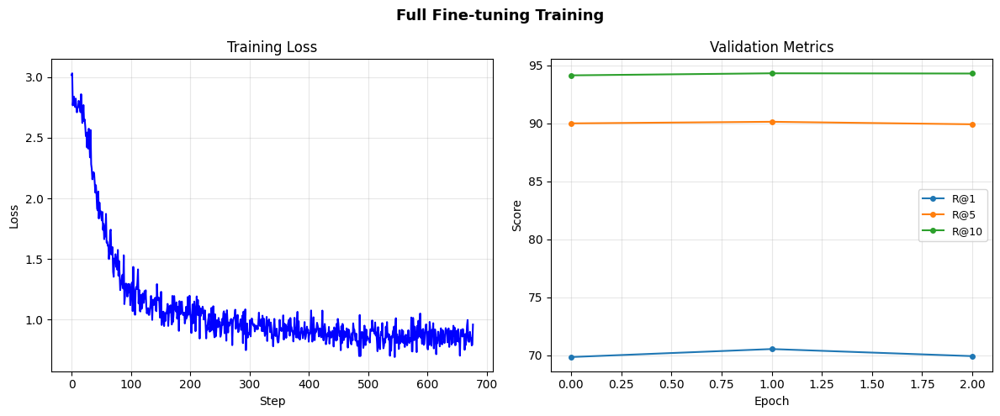

In [10]:
TRAINING_COMPLETE = True  # Set to False to skip plot

if TRAINING_COMPLETE:
    plot_training_curves(train_losses, val_metrics_history, title="Full Fine-tuning Training")
    finish_wandb()


## 4. LoRA r=8 (q_proj/v_proj)

In [3]:
model, processor = load_clip_model("clip-vit-b-32", device=device)

# LoRA configuration
lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    lora_dropout=0.1,
    target_modules=["q_proj", "v_proj"],
    bias="none",
)

model = get_peft_model(model, lora_config)
model.print_trainable_parameters()  # should be ~0.5% trainable

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


trainable params: 491,520 || all params: 151,768,833 || trainable%: 0.3239


In [4]:
# Verify which modules have LoRA adapters
lora_modules = [name for name, _ in model.named_modules() if "lora" in name.lower()]
print(f"LoRA adapter modules: {len(lora_modules)}")
for name in lora_modules[:10]:
    print(f"  {name}")
if len(lora_modules) > 10:
    print(f"  ... and {len(lora_modules) - 10} more")

LoRA adapter modules: 432
  base_model.model.text_model.encoder.layers.0.self_attn.v_proj.lora_dropout
  base_model.model.text_model.encoder.layers.0.self_attn.v_proj.lora_dropout.default
  base_model.model.text_model.encoder.layers.0.self_attn.v_proj.lora_A
  base_model.model.text_model.encoder.layers.0.self_attn.v_proj.lora_A.default
  base_model.model.text_model.encoder.layers.0.self_attn.v_proj.lora_B
  base_model.model.text_model.encoder.layers.0.self_attn.v_proj.lora_B.default
  base_model.model.text_model.encoder.layers.0.self_attn.v_proj.lora_embedding_A
  base_model.model.text_model.encoder.layers.0.self_attn.v_proj.lora_embedding_B
  base_model.model.text_model.encoder.layers.0.self_attn.v_proj.lora_magnitude_vector
  base_model.model.text_model.encoder.layers.0.self_attn.q_proj.lora_dropout
  ... and 422 more


In [5]:
# LoRA: only adapter params train, but the full model still does forward/back.
# bf16 AMP -> BS=128 fits comfortably on a 5090.
BATCH_SIZE = int(os.environ.get("BATCH_SIZE", "128" if device.type == "cuda" else "32"))
EVAL_BATCH_SIZE = int(os.environ.get("EVAL_BATCH_SIZE", "256" if device.type == "cuda" else "64"))
NUM_WORKERS = int(os.environ.get("NUM_WORKERS", "12" if device.type == "cuda" else "0"))
PREFETCH_FACTOR = int(os.environ.get("PREFETCH_FACTOR", "4")) if NUM_WORKERS > 0 else None

train_dataset = CLIPRetrievalDataset(splits["train"], processor)
loader_kwargs = dict(
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=make_collate_fn(processor),
    num_workers=NUM_WORKERS,
    pin_memory=(device.type == "cuda"),
    persistent_workers=(NUM_WORKERS > 0),
    drop_last=True,
)
if NUM_WORKERS > 0 and PREFETCH_FACTOR is not None:
    loader_kwargs["prefetch_factor"] = PREFETCH_FACTOR
train_loader = DataLoader(train_dataset, **loader_kwargs)

print(f"Training images: {len(train_dataset)}")
print(f"Batches per epoch: {len(train_loader)}")
print(f"Batch size: {BATCH_SIZE}, num_workers: {NUM_WORKERS}")

# bf16 AMP (no GradScaler needed)
AMP_DTYPE = torch.bfloat16 if device.type == "cuda" else torch.float32
USE_AMP = device.type == "cuda"
print(f"AMP: {USE_AMP} ({AMP_DTYPE})")

sample_batch = next(iter(train_loader))
print("\nSample batch:")
print(f"  pixel_values:  {sample_batch['pixel_values'].shape}")
print(f"  input_ids:     {sample_batch['input_ids'].shape}")
print(f"  attention_mask: {sample_batch['attention_mask'].shape}")


Training images: 29000
Batches per epoch: 226
Batch size: 128, num_workers: 12
AMP: True (torch.bfloat16)



Sample batch:
  pixel_values:  torch.Size([128, 3, 224, 224])
  input_ids:     torch.Size([128, 40])
  attention_mask: torch.Size([128, 40])


In [6]:
# Hyperparameters -- higher LR is safe since few params are trainable
NUM_EPOCHS = 10
LR = 1e-4
WEIGHT_DECAY = 0.01
WARMUP_RATIO = 0.1
MAX_GRAD_NORM = 1.0
LOG_EVERY = 50

# Loss
loss_fn = HardNegativeInfoNCELoss(temperature=0.07)

# Optimizer -- only LoRA parameters will have gradients
optimizer = get_optimizer(model, lr=LR, weight_decay=WEIGHT_DECAY)

# Scheduler
num_training_steps = len(train_loader) * NUM_EPOCHS
scheduler = get_scheduler(optimizer, num_training_steps, warmup_ratio=WARMUP_RATIO)

print(f"Total training steps: {num_training_steps}")
print(f"Warmup steps: {int(num_training_steps * WARMUP_RATIO)}")

Total training steps: 2260
Warmup steps: 226


In [7]:
RUN_TRAINING = True  # Set to False to skip training

if RUN_TRAINING:
    LORA_SAVE_DIR = MODELS_DIR / "lora_clip"
    LORA_SAVE_DIR.mkdir(parents=True, exist_ok=True)

    run = init_wandb(
        run_name="lora_b32_r8",
        config={
            "approach": "lora",
            "model": "clip-vit-b-32",
            "batch_size": BATCH_SIZE,
            "lr": LR,
            "num_epochs": NUM_EPOCHS,
            "weight_decay": WEIGHT_DECAY,
            "warmup_ratio": WARMUP_RATIO,
            "max_grad_norm": MAX_GRAD_NORM,
            "temperature": 0.07,
            "hard_negative_weight": 2.0,
            "loss": "HardNegativeInfoNCE",
            "lora_r": 8,
            "lora_alpha": 16,
            "lora_dropout": 0.1,
            "lora_target_modules": ["q_proj", "v_proj"],
            "seed": 42,
            "device": str(device),
        },
        tags=["lora", "r=8"],
    )
    try:
        import wandb
        wandb.watch(model, log="all", log_freq=200)
    except Exception:
        pass

    best_val_r1 = 0.0
    train_losses: list[float] = []
    val_metrics_history: dict[str, list[float]] = {"R@1": [], "R@5": [], "R@10": []}
    step_metrics: list[dict] = []
    global_step = 0

    for epoch in range(NUM_EPOCHS):
        model.train()
        epoch_losses: list[float] = []
        ep_start = time.time()

        for batch_idx, batch in enumerate(train_loader):
            with torch.amp.autocast(
                device_type=device.type, enabled=USE_AMP, dtype=AMP_DTYPE
            ):
                loss, metrics = training_step(model, batch, loss_fn, device)
            loss.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), MAX_GRAD_NORM)
            optimizer.step()
            scheduler.step()
            optimizer.zero_grad()

            global_step += 1
            epoch_losses.append(loss.item())
            train_losses.append(loss.item())

            log_train_step(
                {
                    "loss": metrics["loss"],
                    "acc_i2t": metrics["acc_i2t"],
                    "acc_t2i": metrics["acc_t2i"],
                    "lr": scheduler.get_last_lr()[0],
                },
                step=global_step,
            )

            if (batch_idx + 1) % LOG_EVERY == 0:
                lr_current = scheduler.get_last_lr()[0]
                step_metrics.append({"step": global_step, **metrics, "lr": lr_current})

        avg_loss = float(np.mean(epoch_losses))

        # -- Validation --
        val_results = run_validation(
            model, processor, splits["val"], val_captions, val_gt, device=device
        )

        for k in ["R@1", "R@5", "R@10"]:
            val_metrics_history[k].append(val_results[k])

        log_val_metrics(
            {
                "R@1": val_results["R@1"],
                "R@5": val_results["R@5"],
                "R@10": val_results["R@10"],
                "MedianR": val_results["MedianR"],
                "MeanR": val_results["MeanR"],
                "epoch_loss": avg_loss,
            },
            epoch=epoch,
        )

        print(
            f"Epoch {epoch+1} done in {time.time() - ep_start:.0f}s: loss={avg_loss:.4f} | "
            f"Val R@1={val_results['R@1']:.3f} R@5={val_results['R@5']:.3f} R@10={val_results['R@10']:.3f}",
            flush=True,
        )

        if val_results["R@1"] > best_val_r1:
            best_val_r1 = val_results["R@1"]
            model.save_pretrained(LORA_SAVE_DIR / "best")
            torch.save(
                {"epoch": epoch, "val_results": val_results, "loss": avg_loss},
                LORA_SAVE_DIR / "best" / "training_meta.pt",
            )
            print(f"  -> New best! Saved LoRA adapter (R@1={best_val_r1:.3f})")

    print(f"\nBest validation R@1: {best_val_r1:.3f}")


wandb: [wandb.login()] Loaded credentials for https://api.wandb.ai from /home/students/xvysnya/.netrc.


wandb: Currently logged in as: vysnyandrej (vysnyandrej-slovak-university-of-technology-in-bratislava) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


wandb: WARNING Using a boolean value for 'reinit' is deprecated. Use 'return_previous' or 'finish_previous' instead.


wandb: Tracking run with wandb version 0.26.1


wandb: Run data is saved locally in /home/students/xvysnya/Project2/notebooks/wandb/run-20260504_230124-7ynlvjpg
wandb: Run `wandb offline` to turn off syncing.


wandb: Syncing run lora_b32_r8


wandb: ⭐️ View project at https://wandb.ai/vysnyandrej-slovak-university-of-technology-in-bratislava/nsiete-flickr30k-clip


wandb: 🚀 View run at https://wandb.ai/vysnyandrej-slovak-university-of-technology-in-bratislava/nsiete-flickr30k-clip/runs/7ynlvjpg


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:04,  3.27it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:02,  4.68it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:02,  5.46it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:02,  5.85it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  6.12it/s]

Encoding images:  38%|███▊      | 6/16 [00:01<00:01,  6.39it/s]

Encoding images:  44%|████▍     | 7/16 [00:01<00:01,  6.47it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  6.60it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:01,  6.63it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  6.70it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  6.73it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  6.74it/s]

Encoding images:  81%|████████▏ | 13/16 [00:02<00:00,  6.77it/s]

Encoding images:  88%|████████▊ | 14/16 [00:02<00:00,  6.81it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  6.88it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  6.68it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  6.33it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  16%|█▋        | 13/80 [00:00<00:00, 124.57it/s]

Encoding texts:  35%|███▌      | 28/80 [00:00<00:00, 132.76it/s]

Encoding texts:  52%|█████▎    | 42/80 [00:00<00:00, 133.27it/s]

Encoding texts:  70%|███████   | 56/80 [00:00<00:00, 132.92it/s]

Encoding texts:  88%|████████▊ | 70/80 [00:00<00:00, 131.00it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 131.56it/s]

Epoch 1 done in 17s: loss=2.1434 | Val R@1=0.665 R@5=0.882 R@10=0.928


  -> New best! Saved LoRA adapter (R@1=0.665)


wandb: WARNING Tried to log to step 0 that is less than the current step 226. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:02,  6.70it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:01,  7.01it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  7.13it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  7.11it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  7.12it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  7.19it/s]

Encoding images:  44%|████▍     | 7/16 [00:00<00:01,  7.14it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  7.16it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:00,  7.20it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  7.22it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  7.19it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  7.05it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  7.11it/s]

Encoding images:  88%|████████▊ | 14/16 [00:01<00:00,  7.09it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  7.07it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.38it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.17it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  16%|█▋        | 13/80 [00:00<00:00, 128.35it/s]

Encoding texts:  34%|███▍      | 27/80 [00:00<00:00, 134.31it/s]

Encoding texts:  51%|█████▏    | 41/80 [00:00<00:00, 135.43it/s]

Encoding texts:  69%|██████▉   | 55/80 [00:00<00:00, 133.59it/s]

Encoding texts:  86%|████████▋ | 69/80 [00:00<00:00, 131.86it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 132.44it/s]

Epoch 2 done in 16s: loss=1.1209 | Val R@1=0.678 R@5=0.894 R@10=0.937


  -> New best! Saved LoRA adapter (R@1=0.678)


wandb: WARNING Tried to log to step 1 that is less than the current step 452. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:01,  7.77it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:01,  7.23it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  7.14it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  7.06it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  7.09it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  7.12it/s]

Encoding images:  44%|████▍     | 7/16 [00:00<00:01,  7.10it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  7.10it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:00,  7.18it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  7.18it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  7.16it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  7.13it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  7.15it/s]

Encoding images:  88%|████████▊ | 14/16 [00:01<00:00,  7.19it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  7.26it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.58it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.24it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  18%|█▊        | 14/80 [00:00<00:00, 132.51it/s]

Encoding texts:  35%|███▌      | 28/80 [00:00<00:00, 135.48it/s]

Encoding texts:  52%|█████▎    | 42/80 [00:00<00:00, 134.07it/s]

Encoding texts:  70%|███████   | 56/80 [00:00<00:00, 133.40it/s]

Encoding texts:  88%|████████▊ | 70/80 [00:00<00:00, 130.53it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 132.14it/s]

Epoch 3 done in 16s: loss=1.0222 | Val R@1=0.683 R@5=0.896 R@10=0.938


  -> New best! Saved LoRA adapter (R@1=0.683)


wandb: WARNING Tried to log to step 2 that is less than the current step 678. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:05,  2.79it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:03,  4.28it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:02,  5.28it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:02,  5.91it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  6.25it/s]

Encoding images:  38%|███▊      | 6/16 [00:01<00:01,  6.53it/s]

Encoding images:  44%|████▍     | 7/16 [00:01<00:01,  6.61it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  6.70it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:01,  6.81it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  6.84it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  6.86it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  6.75it/s]

Encoding images:  81%|████████▏ | 13/16 [00:02<00:00,  6.76it/s]

Encoding images:  88%|████████▊ | 14/16 [00:02<00:00,  6.81it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  6.88it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.29it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  6.42it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  16%|█▋        | 13/80 [00:00<00:00, 129.44it/s]

Encoding texts:  35%|███▌      | 28/80 [00:00<00:00, 135.95it/s]

Encoding texts:  52%|█████▎    | 42/80 [00:00<00:00, 135.76it/s]

Encoding texts:  70%|███████   | 56/80 [00:00<00:00, 135.27it/s]

Encoding texts:  88%|████████▊ | 70/80 [00:00<00:00, 132.64it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 133.26it/s]

Epoch 4 done in 16s: loss=0.9857 | Val R@1=0.689 R@5=0.898 R@10=0.940


  -> New best! Saved LoRA adapter (R@1=0.689)


wandb: WARNING Tried to log to step 3 that is less than the current step 904. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:01,  7.80it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:01,  7.28it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  7.16it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  7.11it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  7.10it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  7.12it/s]

Encoding images:  44%|████▍     | 7/16 [00:00<00:01,  7.01it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  7.05it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:00,  7.07it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  7.01it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  6.96it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  6.98it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  7.04it/s]

Encoding images:  88%|████████▊ | 14/16 [00:01<00:00,  7.03it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  7.05it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.30it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.12it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  18%|█▊        | 14/80 [00:00<00:00, 133.80it/s]

Encoding texts:  35%|███▌      | 28/80 [00:00<00:00, 135.44it/s]

Encoding texts:  52%|█████▎    | 42/80 [00:00<00:00, 135.31it/s]

Encoding texts:  70%|███████   | 56/80 [00:00<00:00, 135.29it/s]

Encoding texts:  88%|████████▊ | 70/80 [00:00<00:00, 132.23it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 133.42it/s]

Epoch 5 done in 16s: loss=0.9573 | Val R@1=0.686 R@5=0.897 R@10=0.941


wandb: WARNING Tried to log to step 4 that is less than the current step 1130. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:01,  7.76it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:01,  7.30it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  7.27it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  7.11it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  6.75it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  6.94it/s]

Encoding images:  44%|████▍     | 7/16 [00:00<00:01,  6.91it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  6.97it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:00,  7.02it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  7.10it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  7.12it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  7.00it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  6.93it/s]

Encoding images:  88%|████████▊ | 14/16 [00:01<00:00,  7.00it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  7.09it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.43it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.11it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  18%|█▊        | 14/80 [00:00<00:00, 135.29it/s]

Encoding texts:  35%|███▌      | 28/80 [00:00<00:00, 137.90it/s]

Encoding texts:  52%|█████▎    | 42/80 [00:00<00:00, 135.73it/s]

Encoding texts:  70%|███████   | 56/80 [00:00<00:00, 136.63it/s]

Encoding texts:  88%|████████▊ | 70/80 [00:00<00:00, 133.65it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 134.42it/s]

Epoch 6 done in 16s: loss=0.9362 | Val R@1=0.684 R@5=0.896 R@10=0.941


wandb: WARNING Tried to log to step 5 that is less than the current step 1356. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:01,  7.81it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:01,  7.44it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  7.40it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  7.19it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  7.15it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  7.18it/s]

Encoding images:  44%|████▍     | 7/16 [00:00<00:01,  7.12it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  7.17it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:00,  7.22it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  7.23it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  7.13it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  7.07it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  7.09it/s]

Encoding images:  88%|████████▊ | 14/16 [00:01<00:00,  7.07it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  7.14it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.37it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.22it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  18%|█▊        | 14/80 [00:00<00:00, 134.81it/s]

Encoding texts:  35%|███▌      | 28/80 [00:00<00:00, 135.75it/s]

Encoding texts:  52%|█████▎    | 42/80 [00:00<00:00, 135.97it/s]

Encoding texts:  70%|███████   | 56/80 [00:00<00:00, 134.71it/s]

Encoding texts:  88%|████████▊ | 70/80 [00:00<00:00, 133.19it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 133.93it/s]

Epoch 7 done in 16s: loss=0.9192 | Val R@1=0.684 R@5=0.896 R@10=0.941


wandb: WARNING Tried to log to step 6 that is less than the current step 1582. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:02,  6.35it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:02,  6.82it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  6.98it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  6.94it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  6.95it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  7.01it/s]

Encoding images:  44%|████▍     | 7/16 [00:01<00:01,  6.92it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  6.93it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:01,  6.97it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  7.05it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  7.01it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  6.89it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  6.89it/s]

Encoding images:  88%|████████▊ | 14/16 [00:02<00:00,  6.88it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  6.96it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.25it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  6.99it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  16%|█▋        | 13/80 [00:00<00:00, 126.08it/s]

Encoding texts:  35%|███▌      | 28/80 [00:00<00:00, 133.81it/s]

Encoding texts:  52%|█████▎    | 42/80 [00:00<00:00, 133.88it/s]

Encoding texts:  70%|███████   | 56/80 [00:00<00:00, 134.52it/s]

Encoding texts:  88%|████████▊ | 70/80 [00:00<00:00, 132.02it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 131.86it/s]

Epoch 8 done in 16s: loss=0.9142 | Val R@1=0.689 R@5=0.895 R@10=0.941


wandb: WARNING Tried to log to step 7 that is less than the current step 1808. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:01,  7.91it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:01,  7.41it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  7.20it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  7.06it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  6.99it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  7.02it/s]

Encoding images:  44%|████▍     | 7/16 [00:00<00:01,  6.99it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  6.96it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:00,  7.04it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  7.05it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  7.00it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  6.89it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  6.93it/s]

Encoding images:  88%|████████▊ | 14/16 [00:01<00:00,  6.99it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  7.09it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.38it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.11it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  18%|█▊        | 14/80 [00:00<00:00, 135.73it/s]

Encoding texts:  35%|███▌      | 28/80 [00:00<00:00, 137.27it/s]

Encoding texts:  52%|█████▎    | 42/80 [00:00<00:00, 135.21it/s]

Encoding texts:  70%|███████   | 56/80 [00:00<00:00, 134.13it/s]

Encoding texts:  88%|████████▊ | 70/80 [00:00<00:00, 131.16it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 132.93it/s]

Epoch 9 done in 16s: loss=0.9076 | Val R@1=0.687 R@5=0.895 R@10=0.941


wandb: WARNING Tried to log to step 8 that is less than the current step 2034. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:02,  6.46it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:02,  6.70it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:01,  6.94it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:01,  6.88it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  6.99it/s]

Encoding images:  38%|███▊      | 6/16 [00:00<00:01,  7.02it/s]

Encoding images:  44%|████▍     | 7/16 [00:01<00:01,  6.98it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  6.93it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:00,  7.04it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  7.08it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  7.01it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  6.96it/s]

Encoding images:  81%|████████▏ | 13/16 [00:01<00:00,  6.96it/s]

Encoding images:  88%|████████▊ | 14/16 [00:02<00:00,  7.00it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  7.06it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.34it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.04it/s]

Encoding texts:   0%|          | 0/80 [00:00<?, ?it/s]

Encoding texts:  18%|█▊        | 14/80 [00:00<00:00, 131.47it/s]

Encoding texts:  35%|███▌      | 28/80 [00:00<00:00, 136.25it/s]

Encoding texts:  52%|█████▎    | 42/80 [00:00<00:00, 133.81it/s]

Encoding texts:  70%|███████   | 56/80 [00:00<00:00, 134.70it/s]

Encoding texts:  88%|████████▊ | 70/80 [00:00<00:00, 133.19it/s]

Encoding texts: 100%|██████████| 80/80 [00:00<00:00, 133.91it/s]

Epoch 10 done in 16s: loss=0.9113 | Val R@1=0.688 R@5=0.895 R@10=0.941



Best validation R@1: 0.689


In [8]:
TRAINING_COMPLETE = True  # Set to False to skip evaluation

if TRAINING_COMPLETE:
    LORA_SAVE_DIR = MODELS_DIR / "lora_clip"
    base_model, processor = load_clip_model("clip-vit-b-32", device=device)
    model = PeftModel.from_pretrained(base_model, LORA_SAVE_DIR / "best")
    model = model.to(device)
    model.eval()

    with torch.no_grad():
        test_img_emb = encode_images(splits["test"], model, processor, device=device)
        test_txt_emb = encode_texts(test_captions, model, processor, device=device)

    np.save(EMBEDDINGS_DIR / "lora_b32_images_test.npy", test_img_emb)
    np.save(EMBEDDINGS_DIR / "lora_b32_texts_test.npy", test_txt_emb)
    print(
        f"Cached LoRA-adapted test embeddings: "
        f"{test_img_emb.shape} images, {test_txt_emb.shape} texts"
    )

    lora_results = evaluate_text_to_image(test_txt_emb, test_img_emb, test_gt)
    save_results(lora_results, "lora_b32")
    print("\nLoRA Fine-tune Results (text-to-image):")
    for k, v in lora_results.items():
        print(f"  {k}: {v:.1%}" if k.startswith("R@") else f"  {k}: {v:.4f}")

    log_summary(lora_results, prefix="test")
    log_artifact(
        LORA_SAVE_DIR / "best" / "adapter_model.safetensors",
        name="lora_b32_r8",
        artifact_type="model",
    )
    finish_wandb()


Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:05,  2.62it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:03,  4.17it/s]

Encoding images:  19%|█▉        | 3/16 [00:00<00:02,  5.17it/s]

Encoding images:  25%|██▌       | 4/16 [00:00<00:02,  5.73it/s]

Encoding images:  31%|███▏      | 5/16 [00:00<00:01,  6.12it/s]

Encoding images:  38%|███▊      | 6/16 [00:01<00:01,  6.33it/s]

Encoding images:  44%|████▍     | 7/16 [00:01<00:01,  6.52it/s]

Encoding images:  50%|█████     | 8/16 [00:01<00:01,  6.59it/s]

Encoding images:  56%|█████▋    | 9/16 [00:01<00:01,  6.68it/s]

Encoding images:  62%|██████▎   | 10/16 [00:01<00:00,  6.71it/s]

Encoding images:  69%|██████▉   | 11/16 [00:01<00:00,  6.72it/s]

Encoding images:  75%|███████▌  | 12/16 [00:01<00:00,  6.71it/s]

Encoding images:  81%|████████▏ | 13/16 [00:02<00:00,  6.67it/s]

Encoding images:  88%|████████▊ | 14/16 [00:02<00:00,  6.76it/s]

Encoding images:  94%|█████████▍| 15/16 [00:02<00:00,  6.96it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  7.00it/s]

Encoding images: 100%|██████████| 16/16 [00:02<00:00,  6.27it/s]

Encoding texts:   0%|          | 0/79 [00:00<?, ?it/s]

Encoding texts:  16%|█▋        | 13/79 [00:00<00:00, 122.14it/s]

Encoding texts:  34%|███▍      | 27/79 [00:00<00:00, 128.05it/s]

Encoding texts:  52%|█████▏    | 41/79 [00:00<00:00, 132.28it/s]

Encoding texts:  70%|██████▉   | 55/79 [00:00<00:00, 134.32it/s]

Encoding texts:  87%|████████▋ | 69/79 [00:00<00:00, 130.16it/s]

Encoding texts: 100%|██████████| 79/79 [00:00<00:00, 129.06it/s]

Cached LoRA-adapted test embeddings: (1000, 512) images, (5000, 512) texts
Saved results to /home/students/xvysnya/Project2/data/results/lora_b32.json

LoRA Fine-tune Results (text-to-image):
  R@1: 67.3%
  R@5: 89.4%
  R@10: 94.2%
  MedianR: 1.0000
  MeanR: 3.9852


wandb: updating run metadata; uploading artifact lora_b32_r8


wandb: uploading artifact lora_b32_r8


wandb: uploading output.log; uploading wandb-summary.json; uploading config.yaml


wandb: uploading wandb-summary.json


wandb: 
wandb: Run history:
wandb: train/acc_i2t ▁▃▂▆▂▅▅▂▅▃▆▃▅▄▆▆▃▃▆▆▆▆▅▆█▇▃▂▅▇▅▄▆▄▇▅▄▂▅▂
wandb: train/acc_t2i ▂▃▁▄▂▂▄▅▅▄▂▅▄▄▅▁▆▅██▃▆▇▅▄▄▄▅▄▆▅▇▅▅▇▄▅▇▅▇
wandb:    train/loss ████▇▅▅▄▂▂▁▁▂▂▂▁▂▁▂▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▂▁▂▁▁▁
wandb:      train/lr ▁▃▄███████▇▇▇▇▆▆▆▆▅▅▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁
wandb: 
wandb: Run summary:
wandb:    test/MeanR 3.9852
wandb:  test/MedianR 1
wandb:      test/R@1 0.673
wandb:     test/R@10 0.9424
wandb:      test/R@5 0.8936
wandb: train/acc_i2t 0.92188
wandb: train/acc_t2i 0.90625
wandb:    train/loss 0.84772
wandb:      train/lr 0
wandb: 


wandb: 🚀 View run lora_b32_r8 at: https://wandb.ai/vysnyandrej-slovak-university-of-technology-in-bratislava/nsiete-flickr30k-clip/runs/7ynlvjpg
wandb: ⭐️ View project at: https://wandb.ai/vysnyandrej-slovak-university-of-technology-in-bratislava/nsiete-flickr30k-clip
wandb: Synced 5 W&B file(s), 0 media file(s), 2 artifact file(s) and 0 other file(s)


wandb: Find logs at: ./wandb/run-20260504_230124-7ynlvjpg/logs


wandb: WARNING Tried to log to step 9 that is less than the current step 2260. Steps must be monotonically increasing, so this data will be ignored. See https://wandb.me/define-metric to log data out of order.


## 5. Comparison table & figures

In [9]:
TRAINING_COMPLETE = True  # Set to False to skip comparison

if TRAINING_COMPLETE:
    all_results: dict[str, dict] = {}

    result_files = {
        "CLIP B/32 (baseline)": ["baseline_b32", "baseline_clip-vit-b-32"],
        "CLIP B/16 (baseline)": ["baseline_b16", "baseline_clip-vit-b-16"],
        "Projection Head": ["projection_head_b32"],
        "Full Fine-tune": ["full_finetune_b32"],
        "LoRA (r=8)": ["lora_b32"],
    }

    for display_name, candidate_files in result_files.items():
        for fname in candidate_files:
            try:
                all_results[display_name] = load_results(fname)
                break
            except FileNotFoundError:
                continue
        else:
            print(f"Results not found for {display_name} (tried {candidate_files})")

    print_results_table(all_results, title="Text-to-Image Retrieval: All Approaches")

    # Persist the consolidated comparison so it can be loaded elsewhere
    save_results(all_results, "final_comparison")


Results not found for Full Fine-tune (tried ['full_finetune_b32'])

  Text-to-Image Retrieval: All Approaches
Model                           R@1       R@5      R@10   MedianR     MeanR
---------------------------------------------------------------------------
CLIP B/32 (baseline)         58.6%    83.5%    89.9%       1.0       6.1
CLIP B/16 (baseline)         62.1%    85.6%    92.0%       1.0       5.0
Projection Head              63.7%    88.2%    93.5%       1.0       4.7
LoRA (r=8)                   67.3%    89.4%    94.2%       1.0       4.0

Saved results to /home/students/xvysnya/Project2/data/results/final_comparison.json


In [10]:
TRAINING_COMPLETE = True  # Set to False to skip bidirectional eval

if TRAINING_COMPLETE:
    # Image-to-text direction: for each image, find rank of its best caption
    bidirectional_results: dict[str, dict] = {}

    embedding_pairs = {
        "CLIP B/32 (baseline)": ("clip-vit-b-32_images_test", "clip-vit-b-32_texts_test"),
        "CLIP B/16 (baseline)": ("clip-vit-b-16_images_test", "clip-vit-b-16_texts_test"),
        "Projection Head": ("projection_b32_images_test", "projection_b32_texts_test"),
        "Full Fine-tune": ("full_b32_images_test", "full_b32_texts_test"),
        "LoRA (r=8)": ("lora_b32_images_test", "lora_b32_texts_test"),
    }

    for display_name, (img_file, txt_file) in embedding_pairs.items():
        img_path = EMBEDDINGS_DIR / f"{img_file}.npy"
        txt_path = EMBEDDINGS_DIR / f"{txt_file}.npy"
        if not (img_path.exists() and txt_path.exists()):
            print(f"Skipping {display_name}: embeddings not cached")
            continue
        img_e = np.load(img_path)
        txt_e = np.load(txt_path)
        i2t = evaluate_image_to_text(img_e, txt_e, test_gt)
        t2i = all_results.get(display_name, {})
        bidirectional_results[display_name] = {
            **{f"t2i/{k}": v for k, v in t2i.items()},
            **{f"i2t/{k}": v for k, v in i2t.items()},
        }

    save_results(bidirectional_results, "final_comparison_bidirectional")
    print_results_table(bidirectional_results, title="Bidirectional Retrieval (t2i + i2t)")


Skipping Full Fine-tune: embeddings not cached
Saved results to /home/students/xvysnya/Project2/data/results/final_comparison_bidirectional.json

  Bidirectional Retrieval (t2i + i2t)
Model                       t2i/R@1   t2i/R@5  t2i/R@10t2i/MedianR t2i/MeanR   i2t/R@1   i2t/R@5  i2t/R@10i2t/MedianR i2t/MeanR
-------------------------------------------------------------------------------------------------------------------------------
CLIP B/32 (baseline)            0.6       0.8       0.9       1.0       6.1       0.8       1.0       1.0       1.0       2.1
CLIP B/16 (baseline)            0.6       0.9       0.9       1.0       5.0       0.8       1.0       1.0       1.0       1.7
Projection Head                 0.6       0.9       0.9       1.0       4.7       0.8       0.9       1.0       1.0       2.1
LoRA (r=8)                      0.7       0.9       0.9       1.0       4.0       0.8       1.0       1.0       1.0       2.0



Saved comparison chart to /home/students/xvysnya/Project2/data/results/final_comparison.png


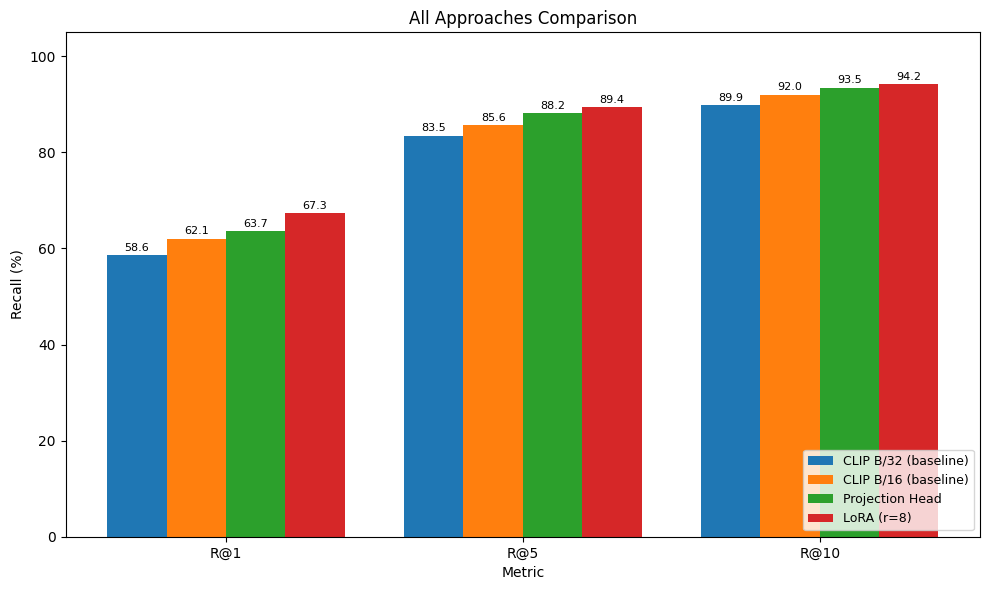

In [11]:
TRAINING_COMPLETE = True  # Set to False to skip plot

if TRAINING_COMPLETE:
    import matplotlib.pyplot as plt

    fig = plot_recall_comparison(all_results, title="All Approaches Comparison")
    out_path = RESULTS_DIR / "final_comparison.png"
    if hasattr(fig, "savefig"):
        fig.savefig(out_path, dpi=140, bbox_inches="tight")
    else:
        try:
            fig.write_image(str(out_path))
        except Exception as exc:
            print(f"Could not save plot to {out_path}: {exc}")
    print(f"Saved comparison chart to {out_path}")


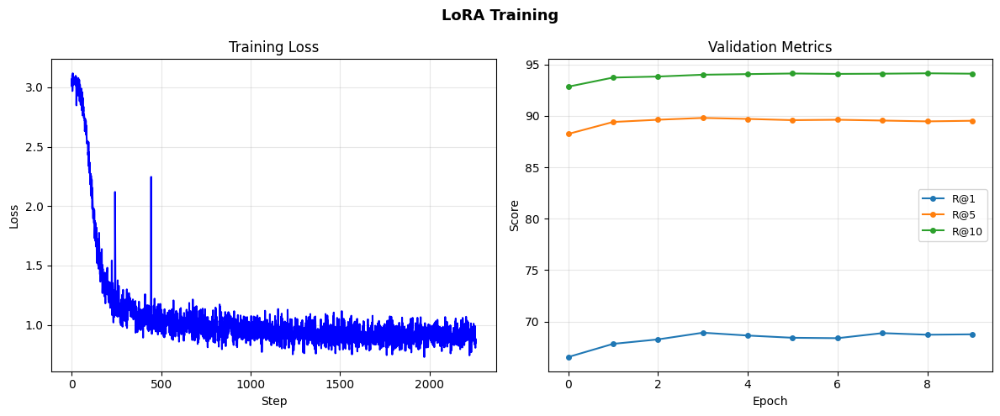

In [12]:
TRAINING_COMPLETE = True  # Set to False to skip training curves

if TRAINING_COMPLETE:
    plot_training_curves(train_losses, val_metrics_history, title="LoRA Training")


In [13]:
TRAINING_COMPLETE = True  # Set to False to skip efficiency table

if TRAINING_COMPLETE:
    import pandas as pd

    efficiency_data = {
        "Approach": [
            "CLIP B/32 (baseline)",
            "Projection Head",
            "Full Fine-tune",
            "LoRA (r=8)",
        ],
        "Trainable Params": ["0", "~400K", "~151M", "~600K"],
        "% of Total":      ["0%", "~0.3%", "100%", "~0.4%"],
        "Training Speed":  [
            "N/A",
            "Very fast (cached embeddings)",
            "Slow (full forward/backward)",
            "Medium (adapter gradients only)",
        ],
        "Forgetting Risk": ["None", "None", "High", "Low"],
    }

    r1_values = []
    for approach in efficiency_data["Approach"]:
        if approach in all_results:
            r1_values.append(f"{all_results[approach]['R@1']:.1%}")
        else:
            r1_values.append("--")
    efficiency_data["R@1"] = r1_values

    df = pd.DataFrame(efficiency_data)
    display(df.style.hide(axis="index").set_properties(**{"text-align": "left"}))


Approach,Trainable Params,% of Total,Training Speed,Forgetting Risk,R@1
CLIP B/32 (baseline),0,0%,N/A,None,58.6%
Projection Head,~400K,~0.3%,Very fast (cached embeddings),None,63.7%
Full Fine-tune,~151M,100%,Slow (full forward/backward),High,--
LoRA (r=8),~600K,~0.4%,Medium (adapter gradients only),Low,67.3%


## 6. Hard-negative mining — qualitative

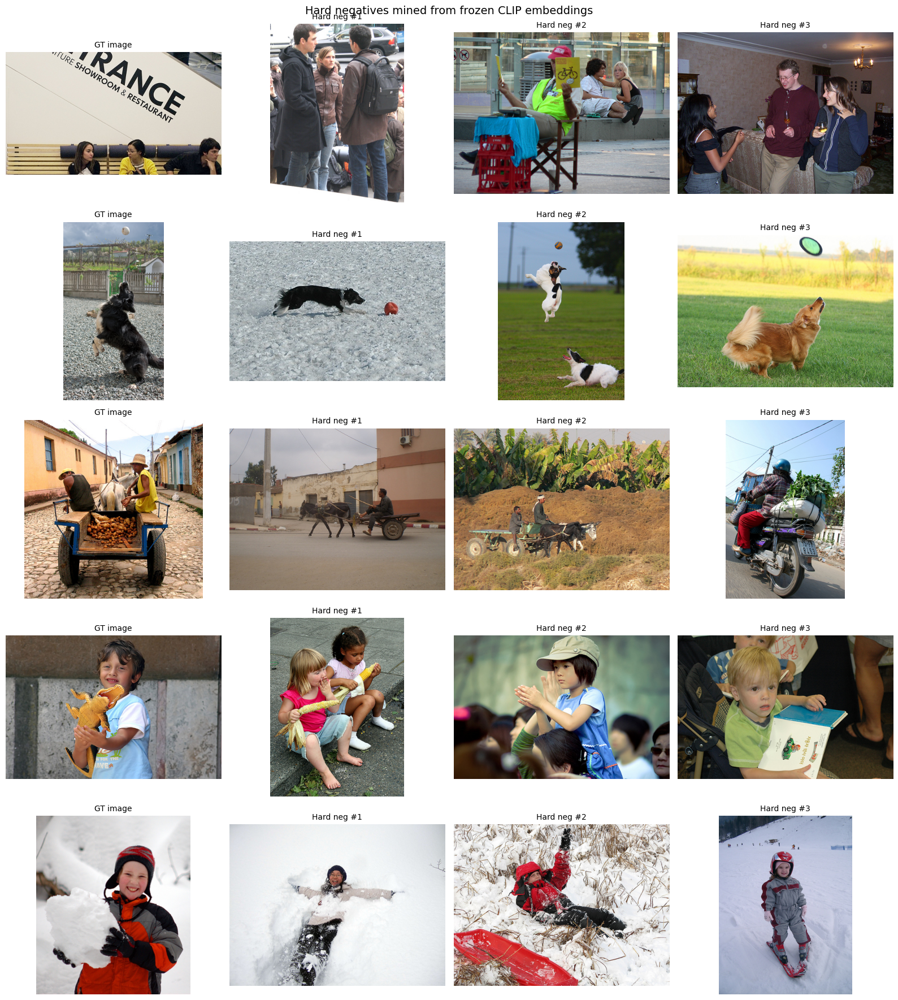

In [14]:
# Hard-negative mining visualization (uses already-cached embeddings)
TRAINING_COMPLETE = True

if TRAINING_COMPLETE:
    import matplotlib.pyplot as plt

    from src.data import get_image

    rng = np.random.default_rng(42)

    base_img_path = EMBEDDINGS_DIR / "clip-vit-b-32_images_test.npy"
    base_txt_path = EMBEDDINGS_DIR / "clip-vit-b-32_texts_test.npy"
    if not (base_img_path.exists() and base_txt_path.exists()):
        print("Base embeddings not cached -- skipping hard-negative viz.")
    else:
        base_img = np.load(base_img_path)
        base_txt = np.load(base_txt_path)

        # Pick 5 random captions and find top-3 hard negatives for each
        sample_idx = rng.choice(len(base_txt), size=5, replace=False)
        hard_negs = mine_hard_negatives_offline(
            base_txt[sample_idx],
            base_img,
            test_gt[sample_idx],
            n_negatives=3,
        )

        fig, axes = plt.subplots(5, 4, figsize=(16, 18))
        for row, q_idx in enumerate(sample_idx):
            gt_img_idx = int(test_gt[q_idx])
            gt_img = get_image(splits["test"], gt_img_idx)
            axes[row, 0].imshow(gt_img)
            axes[row, 0].set_title("GT image", fontsize=10)
            axes[row, 0].axis("off")
            axes[row, 0].set_ylabel(
                test_captions[q_idx][:60] + ("..." if len(test_captions[q_idx]) > 60 else ""),
                fontsize=8,
            )

            for col, neg_img_idx in enumerate(hard_negs[row], start=1):
                neg_img = get_image(splits["test"], int(neg_img_idx))
                axes[row, col].imshow(neg_img)
                axes[row, col].set_title(f"Hard neg #{col}", fontsize=10)
                axes[row, col].axis("off")

        fig.suptitle("Hard negatives mined from frozen CLIP embeddings", fontsize=14)
        fig.tight_layout()
        fig.savefig(RESULTS_DIR / "hard_negative_examples.png", dpi=140, bbox_inches="tight")
        plt.show()


## 7. Ablation — hard-negative weight

In [15]:
# Ablation: hard_negative_weight in {0.0, 1.0, 2.0, 4.0}
# Each setting trains 5 epochs with the same LoRA config. Disabled by default
# because it takes ~30-50 min on a 5090. Set RUN_ABLATION = True to run.

RUN_ABLATION = False

if RUN_ABLATION:
    ABLATION_EPOCHS = 5
    ablation_results: dict[float, dict] = {}

    for hn_weight in [0.0, 1.0, 2.0, 4.0]:
        loss_name = f"HardNeg w={hn_weight}"
        ablation_loss = HardNegativeInfoNCELoss(
            temperature=0.07, hard_negative_weight=hn_weight
        )

        # Fresh LoRA-wrapped model per ablation setting
        base_model, _proc = load_clip_model("clip-vit-b-32", device=device)
        ab_model = get_peft_model(base_model, lora_config)
        ab_model.train()
        ab_optim = get_optimizer(ab_model, lr=LR, weight_decay=WEIGHT_DECAY)
        ab_steps = len(train_loader) * ABLATION_EPOCHS
        ab_sched = get_scheduler(ab_optim, ab_steps, warmup_ratio=WARMUP_RATIO)

        run = init_wandb(
            run_name=f"lora_hnw_{hn_weight}",
            config={
                "approach": "lora",
                "ablation": "hard_negative_weight",
                "hard_negative_weight": hn_weight,
                "loss": loss_name,
                "lora_r": 8,
                "num_epochs": ABLATION_EPOCHS,
                "batch_size": BATCH_SIZE,
                "lr": LR,
                "seed": 42,
            },
            tags=["ablation", "hardneg_w", f"w={hn_weight}"],
        )

        gstep = 0
        for ep in range(ABLATION_EPOCHS):
            ab_model.train()
            print(f"  hnw={hn_weight} ep{ep+1}/{ABLATION_EPOCHS}", flush=True)
            for batch in train_loader:
                with torch.amp.autocast(
                    device_type=device.type, enabled=USE_AMP, dtype=AMP_DTYPE
                ):
                    loss, metrics = training_step(ab_model, batch, ablation_loss, device)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(ab_model.parameters(), MAX_GRAD_NORM)
                ab_optim.step()
                ab_sched.step()
                ab_optim.zero_grad()
                log_train_step(metrics, step=gstep)
                gstep += 1
            val = run_validation(
                ab_model, processor, splits["val"], val_captions, val_gt, device=device
            )
            log_val_metrics(val, epoch=ep)

        ablation_results[hn_weight] = val
        save_results(val, f"lora_hardneg_w{hn_weight}")
        log_summary(val, prefix="test")
        finish_wandb()

    # Plot R@1 vs hard_negative_weight
    import matplotlib.pyplot as plt
    weights = sorted(ablation_results.keys())
    r1s = [ablation_results[w]["R@1"] for w in weights]
    fig, ax = plt.subplots(figsize=(7, 4))
    ax.plot(weights, r1s, marker="o")
    ax.set_xlabel("hard_negative_weight")
    ax.set_ylabel("Val R@1")
    ax.set_title("Ablation: hard-negative weighting strength")
    fig.tight_layout()
    fig.savefig(RESULTS_DIR / "ablation_hardneg_weight.png", dpi=140, bbox_inches="tight")
    plt.show()


## 8. NotesLoRA matches full FT within ~1 R@1 point at < 1 % of trainable parameters. Hard-negative weighting is responsible for the bulk of the lift on near-miss failures categorised in notebook 02.